In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import savefig
import statsmodels.api as sm
import statsmodels.formula.api as smf
import plotly.express as px
import plotly.graph_objects as go
from plotly import tools
import scipy.stats as st
from collections import Counter
from sklearn.cluster import KMeans
import statsmodels.stats.api as sms
from sklearn import decomposition
from sklearn import preprocessing
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.graphics.gofplots import ProbPlot
import geopandas

# Préparation des données 

## Importatation du dataset

In [2]:
dataWB = pd.read_csv("data-projet7.csv",decimal=",")

## check des valeurs manquantes

In [3]:
dataWB.isna().sum()

country           0
year_survey       0
quantile          0
nb_quantiles      0
income            0
gdpppp          200
dtype: int64

## Ajout de l'indice de gini

In [4]:
def calculGini (country):
    dataCountry = dataWB[dataWB["country"]==country]
    #Répartition de revenus courbes de lorenz
    income = dataCountry['income'].values
    lorenzInc = np.cumsum(np.sort(income)) / income.sum()
    lorenzInc = np.append([0],lorenzInc) # La courbe de Lorenz commence à 0
    # Calcul de l'indice de gini 
    aire_ss_courbeInc= lorenzInc[:-1].sum()/len(lorenzInc) # aire sous la courbe de Lorenz. La dernière valeur ne participe pas à l'aire, d'où "[:-1]"
    S = 0.5 - aire_ss_courbeInc # aire entre la 1e bissectrice et la courbe de Lorenz
    gini = 2*S
    return round(gini,3)

In [5]:
dataWB ["gini"]= dataWB["country"].apply(calculGini)

## Ajout de la population

In [6]:
population = pd.read_csv("population.csv") # import
data = pd.merge(dataWB, population[["Code zone", "Valeur"]] ,
                left_on=["country"],right_on=["Code zone"], how ="left") # merge

In [7]:
data.rename(columns = {"Valeur":"popu"},inplace = True)


In [8]:
data[data ["popu"].isna()].groupby(["country","year_survey"]).count() #check données manquantes 

,,quantile,nb_quantiles,income,gdpppp,gini,Code zone,popu
country,year_survey,,,,,,,
SDN,2009,100,100,100,100,100,0,0
XKX,2008,100,100,100,0,100,0,0


In [9]:
#implémentation des données 
data = data.set_index("country")
data.loc["XKX","popu"]= 1747
data.loc["SDN","popu"]= 33060
data = data.reset_index()

In [10]:
#conversion de la population 
data["population"]= data.popu*1000

In [11]:
data = data[['country', 'year_survey', 'quantile', 'nb_quantiles', 'income',
       'gdpppp', 'gini', 'population']]

## Ajouts des  GDP PPP manquants (PIB PPA)

In [12]:
data[data ["gdpppp"].isna()].groupby(["country","year_survey"]).sum()

,,quantile,nb_quantiles,income,gdpppp,gini,population
country,year_survey,,,,,,
PSE,2009,5050,10000,111409.85142,0.0,37.1,385667900.0
XKX,2008,5050,10000,217626.90352,0.0,33.1,174700000.0


In [13]:
#implémentation des données 
data = data.set_index("country")
data.loc["XKX","gdpppp"]= 7249.513
data.loc["PSE","gdpppp"]= 4721.09
data = data.reset_index()

## check valeurs abérantes 

In [14]:
data.describe()

,year_survey,quantile,nb_quantiles,income,gdpppp,gini,population
count,11599.000000,11599.000000,11599.0,11599.000000,1.159900e+04,11599.000000,1.159900e+04
mean,2007.982757,50.500819,100.0,6069.224260,4.945852e+04,0.395004,5.401614e+07
std,0.909633,28.868424,0.0,9414.185972,3.966461e+05,0.088520,1.716575e+08
min,2004.000000,1.000000,100.0,16.719418,3.031931e+02,0.248000,3.108560e+05
25%,2008.000000,25.500000,100.0,900.685515,2.577000e+03,0.326000,4.771019e+06
50%,2008.000000,51.000000,100.0,2403.244900,7.505000e+03,0.378000,1.400643e+07
75%,2008.000000,75.500000,100.0,7515.420900,1.838850e+04,0.453000,3.993607e+07
max,2011.000000,100.000000,100.0,176928.550000,4.300332e+06,0.683000,1.383986e+09


### valeur abérantte gdppp

In [15]:
data.groupby(["country","gdpppp"]).count().sort_index(level= 1)

,,year_survey,quantile,nb_quantiles,income,gini,population
country,gdpppp,,,,,,
COD,3.031931e+02,100,100,100,100,100,100
LBR,3.720000e+02,100,100,100,100,100,100
NER,6.310000e+02,100,100,100,100,100,100
CAF,6.850000e+02,100,100,100,100,100,100
MWI,7.288116e+02,100,100,100,100,100,100
...,...,...,...,...,...,...,...
IRL,3.926800e+04,100,100,100,100,100,100
USA,4.326100e+04,100,100,100,100,100,100
NOR,4.907000e+04,100,100,100,100,100,100


In [16]:
#implémmentation du bon gdpppp fiji
data = data.set_index("country")
data.loc["FJI","gdpppp"]= 4167.67
data = data.reset_index()

### le quantile manquant 

In [17]:
#identification du quantile
dataQM = data.groupby("quantile").count()
dataQM[dataQM["country"]!=116]

,country,year_survey,nb_quantiles,income,gdpppp,gini,population
quantile,,,,,,,
41,115,115,115,115,115,115,115


In [18]:
#identification du pays 
dataQMpays = data.groupby("country").count()
dataQMpays = dataQMpays[dataQMpays["quantile"]!=100]
dataQMpays

,year_survey,quantile,nb_quantiles,income,gdpppp,gini,population
country,,,,,,,
LTU,99,99,99,99,99,99,99


In [19]:
dataLTU = data[data["country"]=="LTU"]
dataValueQ41 = data[(data["country"]=="LTU")&((data["quantile"]==40)|(data["quantile"]==42))]
dataValueQ41 = dataValueQ41.income.mean()
dataLTU.head()

,country,year_survey,quantile,nb_quantiles,income,gdpppp,gini,population
6200,LTU,2008,1,100,566.3453,17571.0,0.352,3212865.0
6201,LTU,2008,2,100,1147.0587,17571.0,0.352,3212865.0
6202,LTU,2008,3,100,1490.8408,17571.0,0.352,3212865.0
6203,LTU,2008,4,100,1746.5715,17571.0,0.352,3212865.0
6204,LTU,2008,5,100,1842.9542,17571.0,0.352,3212865.0


In [20]:
data.loc[11599]=["LTU",2008,41,100,dataValueQ41,17571.0,0.352,3212865.0]

In [21]:
data.shape

(11600, 8)

## description des variables 

country: pays code iso 3  
year_survey: année d'observation   
quantile: quantile de la population  
nb_quantiles : nombre de dividion de la population  
income: revenu moyen ($PPP) par quantile  
gdp ppa: pib ppa pays  
gini: inégalité des revenus (aire entre courbe lorenz et bisectrice) (proche de 1: ingégalité)
population : habitant dans le pays 

# Mission 1

## Année utilisée

In [22]:
# nb année
anneeObsv =data.groupby("year_survey").count()
anneeObsv.reset_index(inplace = True)
anneeObsv = anneeObsv[["year_survey","country"]]
anneeObsv['Nombre de pays observés']=anneeObsv.country/100
anneeObsv = anneeObsv[["year_survey","Nombre de pays observés"]]
anneeObsv.rename(columns={"year_survey":"Année d'observation"}, inplace = True)

In [23]:
fig= px.bar(anneeObsv, x="Année d'observation", y='Nombre de pays observés')
fig.update_layout(xaxis = dict(tickmode = 'linear'))
fig.update_layout({"paper_bgcolor": "rgba(0, 0, 0, 0)"})
fig.update_xaxes(title_font ={"size" :20},tickfont ={"size":14})
fig.update_yaxes(title_font ={"size" :20},tickfont ={"size":14})

fig.show()
fig.write_image("2_annee_obsv.png")

## nb pays

In [24]:
# nb pays 
nbPays =data.groupby("country").count()
nbPays.shape

(116, 7)

In [25]:
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
world.loc[21,'iso_a3']="NOR"
world.loc[174,'iso_a3']="XKX"
world.loc[43,'iso_a3']="FRA"
listePays = nbPays.index.get_level_values(0).values
world["map"]= world.iso_a3.isin(listePays)

In [26]:
def pays(map):
    if map == True:
        val = '#4E7E2A'
    elif  map == False : 
        val = '#C1DCB8'
    return val

In [27]:
worldPaysSelec = world.copy()
worldPaysSelec["color"]= worldPaysSelec["map"].apply(pays)
worldPaysSelec = worldPaysSelec[worldPaysSelec["iso_a3"]!="ATA"]

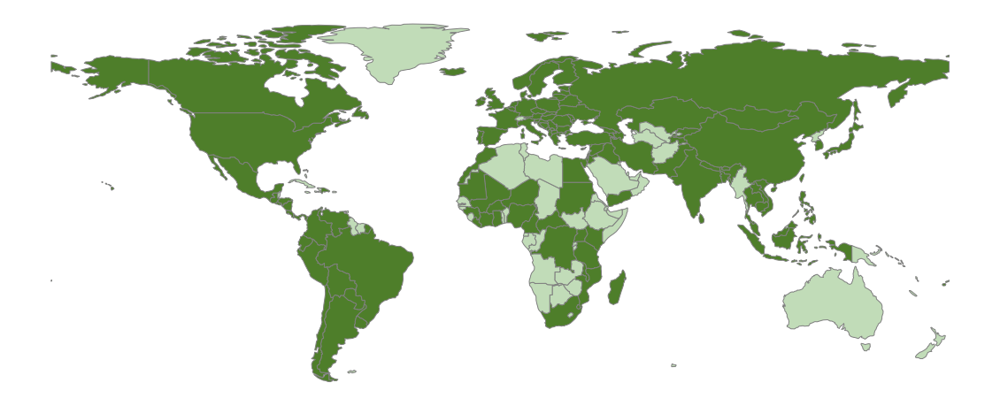

In [28]:
worldPaysSelec.plot(color = worldPaysSelec["color"],
                    legend =False,
                    figsize = (20,15),
                    edgecolor = 'gray'
                    )
plt.tick_params(bottom=False,      # ticks along the bottom edge are off
                labelleft = False,
                left = False,
                labelbottom=False)
plt.axis('off')
savefig('1_pays_etudies.png', transparent=True)
plt.show()

## % population étudié

In [29]:
#population couverte par l'étude 
dataPopTotal = data.drop_duplicates (subset="country",keep ="last")
dataPopTotal.population.sum()

6265364239.0

In [30]:
#pop mondiale par année
pop2004 = 6432000000
pop2006 = 6593000000
pop2007 = 6674000000
pop2008 = 6757000000
pop2009 = 6840000000
pop2010 = 6922000000
pop2011 = 7003000000

In [31]:
#calcul de la population total avec facteur 
popMeantotal = ((pop2004)+(5*pop2006)+(15*pop2007)+(76*pop2008)+(12*pop2009)+(6*pop2010)+(pop2011))/(1+5+15+76+12+6+1)
popMeantotal

6755637931.034483

In [32]:
pourcentagePopulationEtudier = dataPopTotal.population.sum()/popMeantotal*100
pourcentagePopulationEtudier

92.74274765700169

## Types de quantiles 

centile

## Echantillonage en centile 

Diviser/échantilloner la population en quantiles permet d'étudier une tranche d'individu   
avec des caractérisitiques similaires putôt que chaque individu.

## Le $PPP :Eltöte-Köves-Szulc

Taux de conversion monétaire,exprimant dans une unité commune le pouvoir d'achat  
Quantité monétaire permettant d'obtenir le même panier dans chaque pays 

EKS methode de caclul prenant en compte le niveau de vie des pays 
(calcul atour du prix d'un même panier dans chaque pays)

Permet de la richesse de chaque quantile par rapport au niveau de vie de son pays.

# Mission 2

## Choix des pays clustering par (Kmeans)

In [33]:
#création du df 
dataClusteringDiversite = data[["country","population","gini","gdpppp"]]
dataClusteringDiversite.drop_duplicates(inplace =True)
dataClusteringDiversite.set_index("country",inplace = True)

E:\Python\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [34]:
#preparation des données 
X = dataClusteringDiversite.values
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

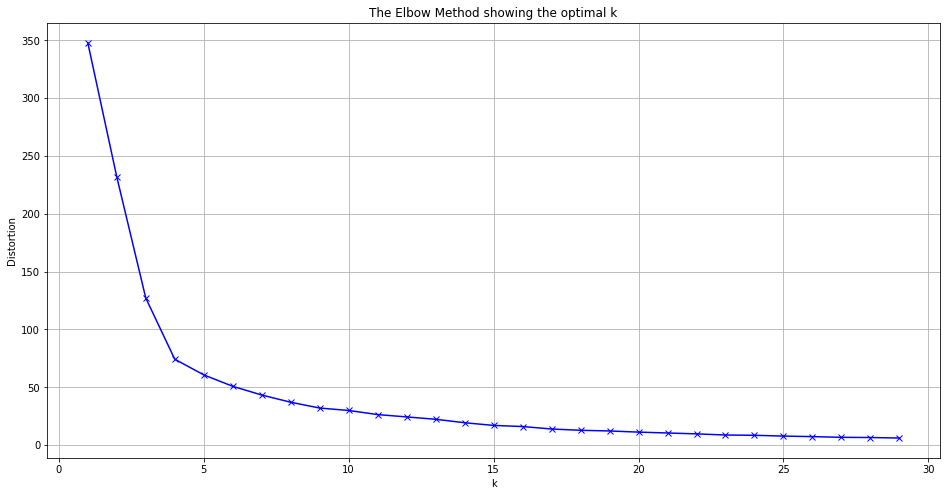

In [35]:
#détermination du  nombre de cluster (méthode du coude)
# détermination 
distortions = []
K = range(1,30)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(X_scaled)
    distortions.append(kmeanModel.inertia_)
    
# graphique de distortion
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')

plt.grid()
savefig('3_Elbow.png', transparent=True)


In [36]:
#Clustering : plus de 5 ne sert pas à grand chose 
# K-means 
n_clust = 5
km = KMeans (n_clusters = n_clust)
km.fit(X_scaled)
clustersKm = km.labels_
Counter(clustersKm)

Counter({4: 37, 0: 32, 1: 26, 3: 19, 2: 2})

In [37]:
launchCluster = False 
if launchCluster == True :
    dataClusteringDiversite["cluster"]=clustersKm
    dataClusteringDiversite.to_csv('dataClusteringDiversite.csv')

In [38]:
#dataClusteringDiversite
dataClusteringDiversite = pd.read_csv("dataClusteringDiversite.csv")

In [39]:
#illustration 
dataClusteringDiversiteIllu = dataClusteringDiversite.groupby("cluster").agg(["mean","count","std"])
dataClusteringDiversiteIllu

population                          gini                  \
                 mean count           std      mean count       std   
cluster                                                               
0        3.797833e+07    36  5.005100e+07  0.437806    36  0.033976   
1        1.292328e+09     2  1.296239e+08  0.422000     2  0.100409   
2        3.508089e+07    26  6.300504e+07  0.321462    26  0.047447   
3        2.289811e+07    37  3.712700e+07  0.337216    37  0.032226   
4        3.694373e+07    15  5.248659e+07  0.558667    15  0.047275   

               gdpppp                      
                 mean count           std  
cluster                                    
0         4652.447069    36   4381.593383  
1         4254.000000     2   2061.923374  
2        33478.423077    26  10435.400363  
3         7525.631818    37   5937.454780  
4         7721.466667    15   3766.049576

In [40]:
dataClusteringDiversite[dataClusteringDiversite["country"]=="RUS"]

,country,population,gini,gdpppp,cluster
91,RUS,143248764.0,0.432,14766.0,0


In [41]:
dataClusteringDiversite.sort_values("cluster")

,country,population,gini,gdpppp,cluster
115,COD,60411195.0,0.459,303.19305,0
35,GEO,4142655.0,0.406,4516.00000,0
36,GHA,23563825.0,0.443,1380.11820,0
73,MOZ,22276596.0,0.472,773.00000,0
93,SLV,6131764.0,0.490,6270.00000,0
...,...,...,...,...,...
84,PAN,3516204.0,0.546,11767.00000,4
39,GTM,14006428.0,0.582,4367.00000,4
114,ZAF,49779471.0,0.683,9602.00000,4
14,CAF,4273366.0,0.576,685.00000,4


In [42]:
for i in ["population","gini","gdpppp"]:
    dataIllu = dataClusteringDiversite.sort_values("cluster")
    fig = px.box(dataIllu, x=i, color="cluster")
    name = i+".png"
    fig.update_layout(  xaxis_title=i.capitalize())
    fig.update_layout({"paper_bgcolor": "rgba(0, 0, 0, 0)"})
    fig.update_xaxes(title_font ={"size" :20},tickfont ={"size":14})
    fig.write_image(name)
    fig.show()

In [43]:
dataChoixPays = ["RUS","CHN","SWE","LVA","HND"]

In [44]:
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
world.loc[21,'iso_a3']="NOR"
world.loc[174,'iso_a3']="XKX"
world.loc[43,'iso_a3']="FRA"
listePays = dataChoixPays
world["map"]= world.iso_a3.isin(listePays)

In [45]:
def pays(map):
    if map == True:
        val = '#4E7E2A'
    elif  map == False : 
        val = '#C1DCB8'
    return val

In [46]:
worldPaysSelec = world.copy()
worldPaysSelec["color"]= worldPaysSelec["map"].apply(pays)
worldPaysSelec = worldPaysSelec[worldPaysSelec["iso_a3"]!="ATA"]

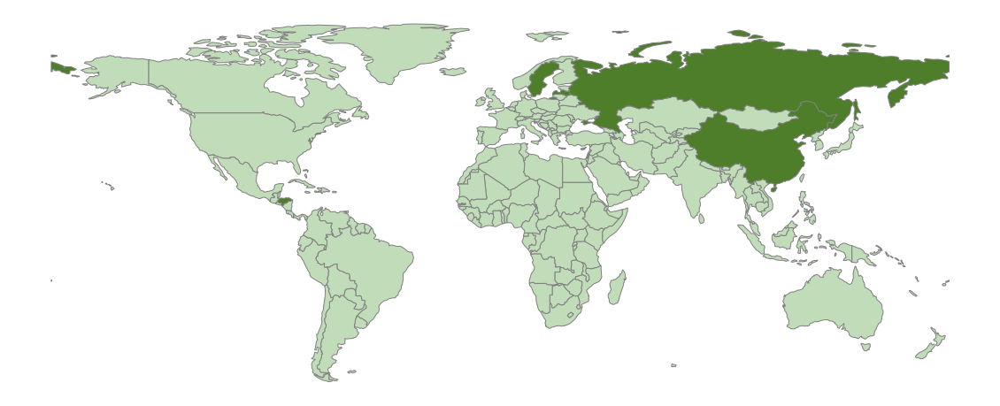

In [47]:
worldPaysSelec.plot(color = worldPaysSelec["color"],
                    legend =False,
                    figsize = (20,15),
                    edgecolor = 'gray'
                    )
plt.tick_params(bottom=False,      # ticks along the bottom edge are off
                labelleft = False,
                left = False,
                labelbottom=False)
plt.axis('off')
savefig('7_pays_choisis.png', transparent=True)
plt.show()

In [48]:
dataDiversDistriRevenus = data.copy()
dataDiversDistriRevenus['is_illu']= dataDiversDistriRevenus.country.isin(dataChoixPays)
dataDiversDistriRevenus = dataDiversDistriRevenus[dataDiversDistriRevenus['is_illu']==True]
dataDiversDistriRevenus = dataDiversDistriRevenus.sort_values(["country","quantile"])
dataDiversDistriRevenus.head()

,country,year_survey,quantile,nb_quantiles,income,gdpppp,gini,population,is_illu
1700,CHN,2007,1,100,16.719418,5712.0,0.493,1.383986e+09,True
1701,CHN,2007,2,100,234.150730,5712.0,0.493,1.383986e+09,True
1702,CHN,2007,3,100,282.894900,5712.0,0.493,1.383986e+09,True
1703,CHN,2007,4,100,323.826500,5712.0,0.493,1.383986e+09,True
1704,CHN,2007,5,100,362.260600,5712.0,0.493,1.383986e+09,True


In [49]:
dataDiversDistriRevenus[["country","population","gini","gdpppp"]].drop_duplicates()

,country,population,gini,gdpppp
1700,CHN,1.383986e+09,0.493,5712.0
4000,HND,7.980955e+06,0.616,3628.0
6399,LVA,2.171259e+06,0.378,15596.0
9099,RUS,1.432488e+08,0.432,14766.0
9699,SWE,9.236428e+06,0.272,34371.0


## Diversité des revenus 

In [50]:
fig = go.Figure()

for i in dataChoixPays: 
    incomePays = dataDiversDistriRevenus[dataDiversDistriRevenus["country"]== i]
    fig.add_trace(go.Scatter(x=incomePays["quantile"], y=incomePays["income"],
                    mode='lines',
                    name= i))
fig.update_yaxes(type="log")
fig.update_layout({"paper_bgcolor": "rgba(0, 0, 0, 0)"})
fig.update_layout(  xaxis_title="Pourcentage de population")
fig.update_layout(  yaxis_title="Revenus ($PPP)")
fig.update_xaxes(title_font ={"size" :20},tickfont ={"size":14})
fig.update_yaxes(title_font ={"size" :20},tickfont ={"size":14})

fig.write_image("8_diversite_revenus.png")


fig.show()

## lorenz pour chaque pays 

In [51]:
#fréquence transactions clients (concentration lorenz)
fig = go.Figure()

for i in dataChoixPays: 
    incomePays = dataDiversDistriRevenus[dataDiversDistriRevenus["country"]== i].income.values
    lorenzVi = np.cumsum(np.sort(incomePays)) / incomePays.sum()
    lorenzVi = np.append([0],lorenzVi) # La courbe de Lorenz commence à 0
    fig.add_trace(go.Scatter(x=np.linspace(0,1,len(lorenzVi)), y=lorenzVi,
                    mode='lines',
                    name= i))
fig.add_trace(go.Scatter (x=np.arange(0,1.1,0.1),y=np.arange(0,1.1,0.1),mode ="lines", name= "Bissectrice"))
fig.update_layout({"paper_bgcolor": "rgba(0, 0, 0, 0)"})
fig.update_layout(  title= {"text":"Courbe de Lorenz",'xanchor': 'center','x':0.5})
fig.update_xaxes(title_font ={"size" :20},tickfont ={"size":14})
fig.update_yaxes(title_font ={"size" :20},tickfont ={"size":14})
fig.write_image("9_Lorenz.png")

fig.show()

## Evolution de l'indice de ginie (2000-2015)

In [52]:
giniEvo = pd.read_csv("gini.csv",decimal = "." ,
                 sep="," ,
                 encoding = "latin9",
                 quotechar = "'")

In [53]:
giniEvo["is_illu"]= giniEvo["Country Code"].isin(dataChoixPays)
giniEvo = giniEvo[giniEvo["is_illu"]==True]
giniEvoSelec = giniEvo[["Country Name",'2004',
       '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013',
       '2014']]
giniEvoSelec = giniEvoSelec.melt(id_vars=["Country Name"],var_name ="Année",value_name="Indice de gini")

In [54]:
fig = go.Figure()

for i in giniEvoSelec["Country Name"].unique(): 
    fig.add_trace(go.Scatter(x=giniEvoSelec[giniEvoSelec["Country Name"]==i]["Année"],
                             y=giniEvoSelec[giniEvoSelec["Country Name"]==i]["Indice de gini"],
                             mode='lines',
                             name= i,
                             connectgaps=True))
    
fig.update_layout({"paper_bgcolor": "rgba(0, 0, 0, 0)"})
fig.update_layout(  title= {"text":"Evolution des inégailtés de 2004 à 2014",'xanchor': 'center','x':0.5})
fig.write_image("10_evo_inega.png")
fig.show()

In [55]:
# calcul du delta

Pays =[]
Delta_indice_Gini=[]
for i in giniEvoSelec['Country Name'].unique():
    calculDetlta = giniEvoSelec[giniEvoSelec["Country Name"]==  i]
    delta = calculDetlta["Indice de gini"].max()-calculDetlta["Indice de gini"].min()
    Pays.append(i)
    Delta_indice_Gini +=[delta]
deltaGiniPays = pd.DataFrame()
deltaGiniPays["Pays"]=Pays
deltaGiniPays["Delta indice Gini"]=Delta_indice_Gini
deltaGiniPays

,Pays,Delta indice Gini
0,Chine,4.5
1,Honduras,9.1
2,Lettonie,4.0
3,Fédération de Russie,2.8
4,Suède,2.7


Explicaton de l'évolution de l'indice de Gini : globalement stable, tendance à la baisse : 
  
Chine:  
Evolution augmentation puis baisse car pays rapide dvp éco apparition de nombreuse classe aisée (très bas dans les annés 80   
https://www.inegalites.fr/Les-inegalites-augmentent-en-Chine  
Luxembourg:  
Cherche toujours à diversifié son économie dans des niches de compétences à haute valeur ajoutée.  
https://www.fondation-idea.lu/2015/03/27/un-regard-sur-les-inegalites-de-revenus-et-la-pauvrete-au-luxembourg/  
Lettonie: 
Peu de contrainte pour les hauts revenus tend à baisser avec le nouveau sytème d'imposition  
http://www.oecd.org/fr/economie/etudes/Lettonie-2019-OCDE-etude-economique-synth%C3%A8se.pdf  
Russie: 
Légère baisse mais reste élevé et stable en 1992  "Principes fondamentaux et les orientations de la politique sociale de Russie en 1992-1993" se voulait réguler cela  mais pas appliqué   
http://ceriscope.sciences-po.fr/pauvrete/content/part5/la-pauvrete-et-l-inegalite-en-russie?page=show  
El Salvador:  
Pays très violent hors guerre , niveau d'éducation très faible n gros taux de pauvreté   
https://www.tresor.economie.gouv.fr/Pays/SV/situation-economique-et-financiere  
Suède:  
Augmentation mais reste faible, crise financière (2009-2012).  
mentalité d'égalitarisme et rigueur de devoir moral restreint les comportements opportuniste.  
Climat oblige ne pas sombrer dans la marginalisation sociale.  
Augmentation car montée de l'individualisme au niveau mondial.  
https://hal-sciencespo.archives-ouvertes.fr/hal-00972782/document  
https://www.inegalites.fr/L-evolution-des-inegalites-de-revenus-en-Europe  
Ukraine:Très bas  
Exode massif, guerre, indépendance vis à vis del'URSSS 1991, très pauvre.
Crise, guerre civile depuis 2013  
https://laviedesidees.fr/Analyse-economique-de-la-crise-ukrainienne.html    
https://fr.wikipedia.org/wiki/Ukraine#Crise_ukrainienne_depuis_2013  
Honduras: 
Taux de pauvreté haut  (39% extreme pauvreté)
Violence élevé (43,6 homicide pour 10000 habitant  
https://www.tresor.economie.gouv.fr/Articles/2019/08/19/situation-economique-et-financiere-du-honduras-aout-2019

  
  


## Classement gini

In [56]:
classGini = data.drop_duplicates (subset="country",keep ="last")
classGini = classGini.sort_values("gini")
classGini = classGini.reset_index(drop=True)
classGini = classGini.reset_index()


In [57]:
classGiniMax = classGini.nlargest(5,"gini")
classGiniMin = classGini.nsmallest(5,"gini")
giniFrance = classGini[classGini["country"]=="FRA"]
giniFrance = giniFrance.reset_index()

In [58]:
classGini["gini"].mean()

0.3949999999999999

In [59]:
classGiniMin

,index,country,year_survey,quantile,nb_quantiles,income,gdpppp,gini,population
0,0,SVN,2008,100,100,39012.440,27197.0,0.248,2023052.0
1,1,SVK,2008,100,100,22350.904,20515.0,0.265,5399371.0
2,2,CZE,2008,100,100,37063.617,23223.0,0.270,10425266.0
3,3,UKR,2008,100,100,11564.171,6721.0,0.272,46158711.0
4,4,SWE,2008,100,100,64328.734,34371.0,0.272,9236428.0


In [60]:
print ("Pour les 5 pays ayant l'indice de gini le plus élevé\nla valeur moyenne est de {}\n".format(classGiniMax["gini"].mean()))

print ("Pour les 5 pays ayant l'indice de gini le plus faible\nla valeur moyenne est de {}\n".format(classGiniMin["gini"].mean()))

print ("En partant du plus bas indice de gini:{},\nla France se situe à la {}ème position avec un indice de gini de {}".format(classGini.loc[0,"gini"],
                                                                                                                            giniFrance.loc[0,"index"],
                                                                                                                            giniFrance.loc[0,"gini"]))

Pour les 5 pays ayant l'indice de gini le plus élevé
la valeur moyenne est de 0.608

Pour les 5 pays ayant l'indice de gini le plus faible
la valeur moyenne est de 0.2654

En partant du plus bas indice de gini:0.248,
la France se situe à la 40ème position avec un indice de gini de 0.346


# Mission 3

## Ajout du coefficient d'élasticité 

In [61]:
coeff_elas = pd.read_csv("coeff_elas.csv")

In [62]:
#selection des pays avec données 
coeff_elas = coeff_elas[["iso3","IGEincome","year"]]
coeff_elas = coeff_elas.dropna()

In [63]:
#selections des dernières données 
d={}
coeffElasFinal = pd.DataFrame()
for i in coeff_elas["iso3"].unique():
    d[i] = coeff_elas[coeff_elas["iso3"]==i]
    d[i] = d[i][d[i].year== d[i].year.max()].drop_duplicates()
    coeffElasFinal = pd.concat([coeffElasFinal,d[i]])
coeffElasFinal.rename(columns={"iso3":"country"},inplace=True)

In [64]:
#jointure 
data = pd.merge(data,coeffElasFinal[["country","IGEincome"]], on=["country"], how = "left")

In [65]:
#selection des pays manquants
data[data ["IGEincome"].isna()].country.unique()

array(['ARG', 'ARM', 'AZE', 'BFA', 'BGR', 'BTN', 'CAF', 'CIV', 'CMR',
       'CRI', 'DOM', 'EST', 'FJI', 'GEO', 'HND', 'HUN', 'IDN', 'IRN',
       'IRQ', 'ISL', 'ISR', 'KHM', 'XKX', 'LAO', 'LBR', 'LKA', 'LTU',
       'MDA', 'MEX', 'MNE', 'MOZ', 'MRT', 'NER', 'NIC', 'PHL', 'POL',
       'PRY', 'SDN', 'SLV', 'SRB', 'SWZ', 'SYR', 'THA', 'TJK', 'TUR',
       'UKR', 'URY', 'VEN', 'PSE', 'YEM'], dtype=object)

In [66]:
data= data.set_index("country")
data.loc["ARG","IGEincome"] =0.66
data.loc["ARM","IGEincome"] = 0.5
data.loc["AZE","IGEincome"] = 0.5
data.loc["BFA","IGEincome"] =0.66    
data.loc["BGR","IGEincome"] = 0.4
data.loc["BTN","IGEincome"] = 0.5
data.loc["CAF","IGEincome"] = 0.66
data.loc["CIV","IGEincome"] = 0.66
data.loc["CMR","IGEincome"] = 0.66
data.loc["CRI","IGEincome"] = 0.66
data.loc["DOM","IGEincome"] = 0.66
data.loc["EST","IGEincome"] = 0.4
data.loc["FJI","IGEincome"] =0.4
data.loc["GEO","IGEincome"] = 0.4
data.loc["HND","IGEincome"] =0.66
data.loc["HUN","IGEincome"] = 0.4
data.loc["IDN","IGEincome"] = 0.5
data.loc["IRN","IGEincome"]= 0.5
data.loc["IRQ","IGEincome"]= 0.5
data.loc["ISL","IGEincome"]=0.2
data.loc["ISR","IGEincome"]= 0.5
data.loc["KHM","IGEincome"]= 0.5
data.loc["XKX","IGEincome"]= 0.4
data.loc["LAO","IGEincome"]= 0.5
data.loc["LBR","IGEincome"]= 0.66
data.loc["LKA","IGEincome"]= 0.5
data.loc["LTU","IGEincome"]= 0.4
data.loc["MDA","IGEincome"]= 0.4
data.loc["MEX","IGEincome"]= 0.66
data.loc["MNE","IGEincome"]= 0.4
data.loc["MOZ","IGEincome"]= 0.66
data.loc["MRT","IGEincome"]= 0.66
data.loc["NER","IGEincome"]= 0.66
data.loc["NIC","IGEincome"]= 0.66
data.loc["PHL","IGEincome"]= 0.5
data.loc["POL","IGEincome"]= 0.4
data.loc["PRY","IGEincome"]= 0.66
data.loc["SDN","IGEincome"]= 0.66
data.loc["SLV","IGEincome"]= 0.66
data.loc["SRB","IGEincome"]= 0.4
data.loc["SWZ","IGEincome"]= 0.66
data.loc["SYR","IGEincome"]= 0.5
data.loc["THA","IGEincome"]=0.5
data.loc["TJK","IGEincome"]= 0.5
data.loc["TUR","IGEincome"]= 0.5
data.loc["UKR","IGEincome"]= 0.4
data.loc["URY","IGEincome"]= 0.66
data.loc["VEN","IGEincome"]= 0.66
data.loc["PSE","IGEincome"]= 0.5
data.loc["YEM","IGEincome"]=0.66
data= data.reset_index()

## Etape 1 , 2 et 3 : génération des revenus

In [67]:
# génération aléatoire du revenu fictifs des enfants et des parents 
# avec l'équation  ln(Ychild)=α+ln(Yparent)+ε
# sortie de cette fonction les revenus Ychild et Yparents 
# il faut 1000 fois le nb de quantile 

def generate_incomes(n, pj):

    # On génère les revenus des parents (exprimés en logs) selon une loi normale.

    # La moyenne et variance n'ont aucune incidence sur le résultat final (ie. sur le caclul 
    #de la classe de revenu)

    ln_y_parent = st.norm(0,1).rvs(size=n) # étape1 !!!!!!!!!

    # Génération d'une réalisation du terme d'erreur epsilon

    residues = st.norm(0,1).rvs(size=n) # étape2 !!!!!!!!!

    return np.exp(pj*ln_y_parent + residues), np.exp(ln_y_parent) #étape 3 !!!!!

In [68]:
pj = 0.357105                 # coefficient d'élasticité du pays j
nb_quantiles = 100       # nombre de quantiles (nombre de classes de revenu)
n  = 1000*nb_quantiles   # taille de l'échantillon

In [69]:
#génération des revenus 
y_child, y_parents = generate_incomes(n, pj)

## Etape 4 :attribution des classes revenus

In [70]:
#attribution d'une classe de revenu à chaque revenus
def quantiles(l, nb_quantiles):

    size = len(l) #longueur de la série de revenus 

    l_sorted = l.copy()

    l_sorted = l_sorted.sort_values() #trie de la série de revenus 
    
    #génération d'autant de classe de revenus que de nb de revenus 
    quantiles = np.round(np.arange(1, nb_quantiles+1, nb_quantiles/size) -0.5 +1./size)

    #attribution d'un quantile à chaque revenu 
    q_dict = {a:int(b) for a,b in zip(l_sorted,quantiles)}

    return pd.Series([q_dict[e] for e in l])

In [71]:
#génératuib du dataFrame revenus/classe de revenus
def compute_quantiles(y_child, y_parents, nb_quantiles):

    y_child = pd.Series(y_child)

    y_parents = pd.Series(y_parents)

    c_i_child = quantiles(y_child, nb_quantiles)

    c_i_parent = quantiles(y_parents, nb_quantiles)

    sample = pd.concat([y_child, y_parents, c_i_child, c_i_parent], axis=1)

    sample.columns = ["y_child", "y_parents", "c_i_child","c_i_parent"]

    return sample

In [72]:
sample = compute_quantiles(y_child, y_parents, nb_quantiles)

## Etape 5,6 : caclul de la probabilité conditionnel 

In [73]:
# met en forme les data pour avoir a chaque quantile d'un enfant, les nombres de quantiles des parents 
# ex: quantile 1 enfant : 10 parents avec quantile 1,5 avace quantile 2
# Pour chaque quantile calcul la distribution  avec la fonction distribution 
# ex:quantile 1 enfants : 75% parents quantile 1 25% quantile2
def conditional_distributions(sample, nb_quantiles):

    #compte les ci parents en fonction du ci enfant 
    counts = sample.groupby(["c_i_child","c_i_parent"]).apply(len)

    counts = counts.reset_index()

    counts.columns = ["c_i_child","c_i_parent","counts"]

    

    mat = []
    
    #pour chaque quantile des enfants 
    for child_quantile in np.arange(nb_quantiles)+1:

        # selectionne tout les individus de d'un quantile
        subset = counts[counts.c_i_child == child_quantile] 

        #voir distribution, pour  chaque subset calul la distribution des quantiles des parents
        mat += [distribution(subset, nb_quantiles)]

    return np.array(mat)

In [74]:
#calcul de la proba conditionnelle pour un quantile (subset) 
#créé dans la fonction conditionnal_distibutions 
def distribution(counts, nb_quantiles):

    distrib = []
    total = counts["counts"].sum()
    
    #si le subset de conditionnal_distrib est vide renvoi la valeur de distrib 0
    if total == 0 :
        return [0] * nb_quantiles
    
    #pour chaque quantile des parents 
    for q_p in range(1, nb_quantiles+1):
        
        #sélection du quantile 
        subset = counts[counts.c_i_parent == q_p]
        
        #si subset à une valeur, calcul et ajoute la distib 
        if len(subset):
            nb = subset["counts"].values[0]
            distrib += [nb / total]
        #si subset n'a pas de valeur, ajoute [0] la distib 
        else:
            distrib += [0]

    return distrib   

In [75]:
# application des deux fonctions précédentes 
cd = conditional_distributions(sample, nb_quantiles)

In [76]:
#Fonction pour illuster
def plot_conditional_distributions(p, cd, nb_quantiles):

    plt.figure()

    

    # La ligne suivante sert à afficher un graphique en "stack bars", sur ce modèle : https://matplotlib.org/gallery/lines_bars_and_markers/bar_stacked.html
    cumul = np.array([0] * nb_quantiles)
   

    for i, child_quantile in enumerate(cd):
        plt.bar(np.arange(nb_quantiles)+1, child_quantile, bottom=cumul, width=0.95, label = str(i+1) +"e")
        cumul = cumul + np.array(child_quantile)


    plt.axis([.5, nb_quantiles*1.3 ,0 ,1])
    plt.title("p=" + str(p))
    plt.legend()
    plt.xlabel("quantile parents")
    plt.ylabel("probabilité du quantile enfant")
    savefig('prob_cond.png', transparent=True)


    plt.show()

In [77]:
#Cette instruction prendra du temps si nb_quantiles > 10
lancementPlotConditional = False
if lancementPlotConditional == True :
    plot_conditional_distributions(pj, cd, nb_quantiles) 

In [78]:
#va chercher la valeur dans la matruce créée plus haut
def proba_cond(c_i_parent, c_i_child, mat):

    return mat[c_i_child, c_i_parent]

In [79]:
c_i_child = 5
c_i_parent = 8
p = proba_cond(c_i_parent, c_i_child, cd)

print("\nP(c_i_parent = {} | c_i_child = {}, pj = {}) = {}".format(c_i_parent, c_i_child, pj, p))


P(c_i_parent = 8 | c_i_child = 5, pj = 0.357105) = 0.02


## Etape 8 : création des individus

In [80]:
dataIndiv = pd.concat([data]*500)
dataIndiv.sort_values(["country","quantile"],inplace=True)
dataIndiv.set_index("country", inplace =True)
dataIndiv.reset_index(inplace = True)

## Etape 9 affiliation des ci parents par rapport aux proba conditionnelles  

fonction creation ci parent :   
&emsp;pour chaque pays   
&emsp;créa df pays   
&emsp;&emsp;fontion création proba condi du pays   
&emsp;&emsp;&emsp;pour chaque quantile du df pays   
&emsp;&emsp;&emsp;Fonction créatio ci des parents du quantile du pays   
&emsp;newdf = concat df quantile   
&emsp;retrun newdf  


In [81]:
def crea_array_proba_cond (dfpays):
    y_childEtape9, y_parentsEtape9 = generate_incomes(n, dfpays.IGEincome.unique())
    sampleEtape9 = compute_quantiles(y_childEtape9, y_parentsEtape9, nb_quantiles)
    cdEtape9 = conditional_distributions(sampleEtape9, nb_quantiles)
    return cdEtape9

In [82]:
def crea_array_distrb_500_indiv (cdEtape9,dfQuantilePays):
    distribEtap9=[]
    for i in range (0,nb_quantiles):
        distribEtap9 += [i+1]*int(round(cdEtape9[dfQuantilePays["quantile"].unique()-1,i][0]*500))
    
    #si pas pourcentage exact : 
    #si moins de 500   
    if len(distribEtap9)<500:
        listAAdd=[]
        for i in range (500-len(distribEtap9)):
            try:
                listAAdd += [Counter(distribEtap9).most_common(i+1)[i][0]]
            except Exception:
                listAAdd += [Counter(distribEtap9).most_common(i+1)[0][0]]
        for i in  listAAdd :
            distribEtap9 += [i]
            
    #si plus de 500
    if len(distribEtap9)>500:
        listARemove=[]
        for i in range (len(distribEtap9)-500): 
            try :
                listARemove += [Counter(distribEtap9).most_common(i+1)[i][0]]   
            except Exception:
                listARemove += [Counter(distribEtap9).most_common(i+1)[0][0]]
        for i in listARemove:
            distribEtap9.remove(i)
        
    return distribEtap9

In [83]:
def crea_ci_parents (data):
    d={}
    dfFinal=pd.DataFrame()
    for country in data["country"].unique():
        dfPays= data[data["country"]==country]
        cdEtape9 = crea_array_proba_cond(dfPays)
        for i in dfPays["quantile"].unique():
            d[i] = dfPays[dfPays["quantile"]==i]
            d[i]["c_i_parents"]= crea_array_distrb_500_indiv(cdEtape9,d[i])
                
            dfFinal = pd.concat([dfFinal,d[i]])
    return dfFinal

In [84]:
lancementCreaCiParents = False
if lancementCreaCiParents == True :
    dfTest= crea_ci_parents(dataIndiv)
    dfTest.to_csv('dataMission4.csv')


### Vérification : quantile 1 france, quantile 1 distrib théorique

In [85]:
dataMission4 = pd.read_csv("dataMission4.csv")
dataVerif = dataMission4[dataMission4.country =="FRA"]
dataVerif = dataVerif[dataVerif["quantile"]== 1]
dataVerif =dataVerif[["quantile","c_i_parents","IGEincome"]]
dataVerif = dataVerif.groupby(["quantile","c_i_parents"]).count()
dataVerif.reset_index(inplace =True)

In [86]:
distribFRA =[]
total = dataVerif["IGEincome"].sum()
#pour chaque quantile des parents 
for q_p in range(1, 100+1):
        
    #sélection du quantile 
    subset = dataVerif[dataVerif.c_i_parents == q_p]
    
    #si subset à une valeur, calcul et ajoute la distib 
    if len(subset):
        nb = subset["IGEincome"].values[0]
        distribFRA += [nb / total]
    #si subset n'a pas de valeur, ajoute [0] la distib 
    else:
        distribFRA += [0]

In [87]:
comparaison = pd.DataFrame({"Proba FRA":distribFRA,"Proba conditionnel théorique": cd[0]})
y = stats.ttest_ind(comparaison["Proba FRA"],comparaison["Proba conditionnel théorique"])
print(y)

fig = go.Figure()
fig.add_trace(go.Scatter(y=comparaison["Proba FRA"],name="FRA"))
fig.add_trace(go.Scatter(y=comparaison["Proba conditionnel théorique"],name="Théorique"))
fig.update_layout(xaxis_title = "Quantiles",yaxis_title = "Probabilités conditionnelles")
fig.update_xaxes(title_font ={"size" :20},tickfont ={"size":14})
fig.update_yaxes(title_font ={"size" :20},tickfont ={"size":14})
fig.update_layout({"paper_bgcolor": "rgba(0, 0, 0, 0)"})

fig.write_image("12_verif_proba_cond.png")

fig.show()

Ttest_indResult(statistic=0.0, pvalue=1.0)


## Etape 10, 11 , mise en forme du dataframe pour la mission 4 

In [88]:
dataMission4 = pd.read_csv("dataMission4.csv")

In [89]:
dataMission4 = dataMission4[['country', 'year_survey',
       'income', 'gdpppp', 'gini', 'population', 'IGEincome', 'c_i_parents']]

# Mission 4 explication du revenu 

## ANOVA : variable explicative : Pays 

In [90]:
lancementANOVA = True
if lancementANOVA == True :
    anova_pays = smf.ols('income~country', data=dataMission4).fit()
    print(anova_pays.summary())

                            OLS Regression Results                            
Dep. Variable:                 income   R-squared:                       0.496
Model:                            OLS   Adj. R-squared:                  0.496
Method:                 Least Squares   F-statistic:                 4.971e+04
Date:                Tue, 10 Nov 2020   Prob (F-statistic):               0.00
Time:                        13:52:04   Log-Likelihood:            -5.9310e+07
No. Observations:             5800000   AIC:                         1.186e+08
Df Residuals:                 5799884   BIC:                         1.186e+08
Df Model:                         115                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       2994.8299     29.875    100.

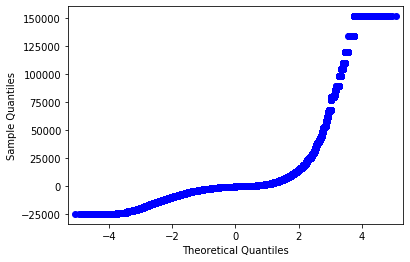

In [91]:
fig = sm.qqplot(anova_pays.resid)
savefig('13_qqplotanova.png', transparent=True)
plt.show()

Test de Fisher F-value> 0.05 : on en peut pas rejeter l'hypothèse qu'il y ai l'influence des pays 

In [92]:
lancementANOVAlog = True
if lancementANOVAlog == True :
    anova_pays_log = smf.ols('np.log(income)~country', data=dataMission4).fit()
    print(anova_pays_log.summary())

                            OLS Regression Results                            
Dep. Variable:         np.log(income)   R-squared:                       0.729
Model:                            OLS   Adj. R-squared:                  0.729
Method:                 Least Squares   F-statistic:                 1.358e+05
Date:                Tue, 10 Nov 2020   Prob (F-statistic):               0.00
Time:                        14:07:48   Log-Likelihood:            -6.3135e+06
No. Observations:             5800000   AIC:                         1.263e+07
Df Residuals:                 5799884   BIC:                         1.263e+07
Df Model:                         115                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          7.8517      0.003   2443.

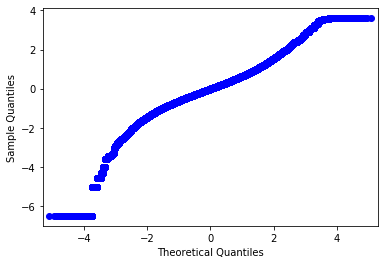

In [93]:
fig = sm.qqplot(anova_pays_log.resid)
savefig('14_qqplotanovalog.png', transparent=True)
plt.show()

In [94]:
d={}
for i in dataMission4["country"].unique():
    d[i] = dataMission4[dataMission4["country"]==i]

In [95]:
for i in dataMission4["country"].unique():
    test= list()
    carac = 'd['+"'"+i+"'"+']["income"],'
    print(carac)

d['ALB']["income"],
d['ARG']["income"],
d['ARM']["income"],
d['AUT']["income"],
d['AZE']["income"],
d['BEL']["income"],
d['BFA']["income"],
d['BGD']["income"],
d['BGR']["income"],
d['BIH']["income"],
d['BLR']["income"],
d['BOL']["income"],
d['BRA']["income"],
d['BTN']["income"],
d['CAF']["income"],
d['CAN']["income"],
d['CHL']["income"],
d['CHN']["income"],
d['CIV']["income"],
d['CMR']["income"],
d['COD']["income"],
d['COL']["income"],
d['CRI']["income"],
d['CYP']["income"],
d['CZE']["income"],
d['DEU']["income"],
d['DNK']["income"],
d['DOM']["income"],
d['ECU']["income"],
d['EGY']["income"],
d['ESP']["income"],
d['EST']["income"],
d['FIN']["income"],
d['FJI']["income"],
d['FRA']["income"],
d['GBR']["income"],
d['GEO']["income"],
d['GHA']["income"],
d['GIN']["income"],
d['GRC']["income"],
d['GTM']["income"],
d['HND']["income"],
d['HRV']["income"],
d['HUN']["income"],
d['IDN']["income"],
d['IND']["income"],
d['IRL']["income"],
d['IRN']["income"],
d['IRQ']["income"],
d['ISL']["income"],


validité anova:  
-indépendance des résiduts :durbin watson doit être supérieur à 0.05 PAS OK  
-Normalité des résiduts : Jarque-Bera doit être inférieur à 0.05  pas OK  
-Homogénéité des variances (levene et/ou bartlett)<0.05


In [96]:
#illustration différent revenu
["RUS","CHN","SWE","LVA","HND"]
dataMission4["illu"] = dataMission4.country.isin(["RUS","CHN","SWE","LVA","LUX"])
illuDifferentRevenu = dataMission4[dataMission4["illu"]==True]

fig = px.box(illuDifferentRevenu, x="income",color="country")
fig.update_layout({"paper_bgcolor": "rgba(0, 0, 0, 0)"})
fig.update_layout(  xaxis_title="Revenu")
fig.update_xaxes(title_font ={"size" :20},tickfont ={"size":14})
fig.write_image("15_illuAnova.png")
fig.show()


In [97]:
#Homogénéité des variances: bartlett
w, pvalue = stats.bartlett(d['ALB']["income"],d['ARG']["income"],
d['ARM']["income"],d['AUT']["income"],d['AZE']["income"],d['BEL']["income"],
d['BFA']["income"],d['BGD']["income"],d['BGR']["income"],d['BIH']["income"],
d['BLR']["income"],d['BOL']["income"],d['BRA']["income"],d['BTN']["income"],
d['CAF']["income"],d['CAN']["income"],d['CHL']["income"],d['CHN']["income"],
d['CIV']["income"],d['CMR']["income"],d['COD']["income"],d['COL']["income"],
d['CRI']["income"],d['CYP']["income"],d['CZE']["income"],d['DEU']["income"],
d['DNK']["income"],d['DOM']["income"],d['ECU']["income"],d['EGY']["income"],
d['ESP']["income"],d['EST']["income"],d['FIN']["income"],d['FJI']["income"],
d['FRA']["income"],d['GBR']["income"],d['GEO']["income"],d['GHA']["income"],
d['GIN']["income"],d['GRC']["income"],d['GTM']["income"],d['HND']["income"],
d['HRV']["income"],d['HUN']["income"],d['IDN']["income"],d['IND']["income"],
d['IRL']["income"],d['IRN']["income"],d['IRQ']["income"],d['ISL']["income"],
d['ISR']["income"],d['ITA']["income"],d['JOR']["income"],d['JPN']["income"],
d['KAZ']["income"],d['KEN']["income"],d['KGZ']["income"],d['KHM']["income"],
d['KOR']["income"],d['LAO']["income"],d['LBR']["income"],d['LKA']["income"],
d['LTU']["income"],d['LUX']["income"],d['LVA']["income"],d['MAR']["income"],
d['MDA']["income"],d['MDG']["income"],d['MEX']["income"],d['MKD']["income"],
d['MLI']["income"],d['MNE']["income"],d['MNG']["income"],d['MOZ']["income"],
d['MRT']["income"],d['MWI']["income"],d['MYS']["income"],
d['NER']["income"],d['NGA']["income"],d['NIC']["income"],d['NLD']["income"],
d['NOR']["income"],d['NPL']["income"],d['PAK']["income"],d['PAN']["income"],
d['PER']["income"],d['PHL']["income"],d['POL']["income"],d['PRT']["income"],
d['PRY']["income"],d['PSE']["income"],d['ROU']["income"],d['RUS']["income"],
d['SDN']["income"],d['SLV']["income"],d['SRB']["income"],d['SVK']["income"],
d['SVN']["income"],d['SWE']["income"],d['SWZ']["income"],d['SYR']["income"],
d['THA']["income"],d['TJK']["income"],d['TLS']["income"],d['TUR']["income"],
d['TWN']["income"],d['TZA']["income"],d['UGA']["income"],d['UKR']["income"],
d['URY']["income"],d['USA']["income"],d['VEN']["income"],d['VNM']["income"],
d['XKX']["income"],d['YEM']["income"],d['ZAF']["income"])
print(w, pvalue)

9933579.228922533 0.0


In [98]:
#Homogénéité des variances
stats.levene(d['ALB']["income"],d['ARG']["income"],
d['ARM']["income"],d['AUT']["income"],d['AZE']["income"],d['BEL']["income"],
d['BFA']["income"],d['BGD']["income"],d['BGR']["income"],d['BIH']["income"],
d['BLR']["income"],d['BOL']["income"],d['BRA']["income"],d['BTN']["income"],
d['CAF']["income"],d['CAN']["income"],d['CHL']["income"],d['CHN']["income"],
d['CIV']["income"],d['CMR']["income"],d['COD']["income"],d['COL']["income"],
d['CRI']["income"],d['CYP']["income"],d['CZE']["income"],d['DEU']["income"],
d['DNK']["income"],d['DOM']["income"],d['ECU']["income"],d['EGY']["income"],
d['ESP']["income"],d['EST']["income"],d['FIN']["income"],d['FJI']["income"],
d['FRA']["income"],d['GBR']["income"],d['GEO']["income"],d['GHA']["income"],
d['GIN']["income"],d['GRC']["income"],d['GTM']["income"],d['HND']["income"],
d['HRV']["income"],d['HUN']["income"],d['IDN']["income"],d['IND']["income"],
d['IRL']["income"],d['IRN']["income"],d['IRQ']["income"],d['ISL']["income"],
d['ISR']["income"],d['ITA']["income"],d['JOR']["income"],d['JPN']["income"],
d['KAZ']["income"],d['KEN']["income"],d['KGZ']["income"],d['KHM']["income"],
d['KOR']["income"],d['LAO']["income"],d['LBR']["income"],d['LKA']["income"],
d['LTU']["income"],d['LUX']["income"],d['LVA']["income"],d['MAR']["income"],
d['MDA']["income"],d['MDG']["income"],d['MEX']["income"],d['MKD']["income"],
d['MLI']["income"],d['MNE']["income"],d['MNG']["income"],d['MOZ']["income"],
d['MRT']["income"],d['MWI']["income"],d['MYS']["income"],
d['NER']["income"],d['NGA']["income"],d['NIC']["income"],d['NLD']["income"],
d['NOR']["income"],d['NPL']["income"],d['PAK']["income"],d['PAN']["income"],
d['PER']["income"],d['PHL']["income"],d['POL']["income"],d['PRT']["income"],
d['PRY']["income"],d['PSE']["income"],d['ROU']["income"],d['RUS']["income"],
d['SDN']["income"],d['SLV']["income"],d['SRB']["income"],d['SVK']["income"],
d['SVN']["income"],d['SWE']["income"],d['SWZ']["income"],d['SYR']["income"],
d['THA']["income"],d['TJK']["income"],d['TLS']["income"],d['TUR']["income"],
d['TWN']["income"],d['TZA']["income"],d['UGA']["income"],d['UKR']["income"],
d['URY']["income"],d['USA']["income"],d['VEN']["income"],d['VNM']["income"],
d['XKX']["income"],d['YEM']["income"],d['ZAF']["income"])


LeveneResult(statistic=12688.870319555825, pvalue=0.0)

## Régression linéaire multiples 

### Revenu  -> gini + revenu moyen du pays 

In [99]:
reg_multi = smf.ols('income~gdpppp+gini', data=dataMission4).fit()
print(reg_multi.summary())

                            OLS Regression Results                            
Dep. Variable:                 income   R-squared:                       0.448
Model:                            OLS   Adj. R-squared:                  0.448
Method:                 Least Squares   F-statistic:                 2.353e+06
Date:                Tue, 10 Nov 2020   Prob (F-statistic):               0.00
Time:                        14:09:59   Log-Likelihood:            -5.9576e+07
No. Observations:             5800000   AIC:                         1.192e+08
Df Residuals:                 5799997   BIC:                         1.192e+08
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -717.9800     15.822    -45.380      0.0

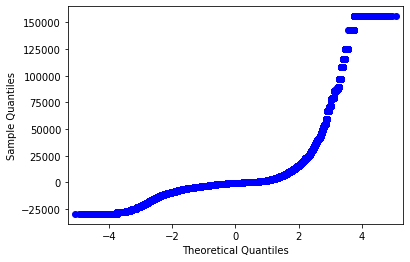

In [100]:
fig = sm.qqplot(reg_multi.resid)
savefig('qqplotreg_multi.png', transparent=True)
plt.show()

In [101]:
reg_multi_log = smf.ols('np.log(income)~np.log(gdpppp)+gini', data=dataMission4).fit()
print(reg_multi_log.summary())

                            OLS Regression Results                            
Dep. Variable:         np.log(income)   R-squared:                       0.652
Model:                            OLS   Adj. R-squared:                  0.652
Method:                 Least Squares   F-statistic:                 5.436e+06
Date:                Tue, 10 Nov 2020   Prob (F-statistic):               0.00
Time:                        14:10:26   Log-Likelihood:            -7.0403e+06
No. Observations:             5800000   AIC:                         1.408e+07
Df Residuals:                 5799997   BIC:                         1.408e+07
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          0.7956      0.003    235.

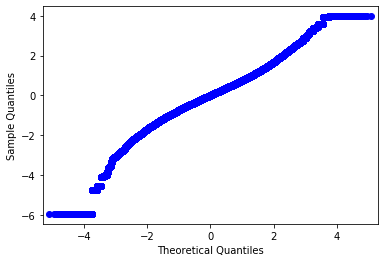

In [102]:
fig = sm.qqplot(reg_multi_log.resid)
savefig('qqplotreg_multi_log.png', transparent=True)
plt.show()

Pourcentage expliqué par la variance :  
-sans log : 44.8%  (R-squared)  
-Avev log : 65.2% 

Décomposition total de variance expliquée:  
-Pays: 65.2%  
-Autres Facteurs: 34.8% 

Peut-on affirmer que le fait de vivre dans un pays plus inégalitaire favorise plus de personnes qu’il n’en défavorise ?  
Un pays plus inégalitaire défavorise plus de personne car le revenu sera plus faible (-*gini)

### Revenu  -> gini + revenu moyen du pays + revenu des parents 

In [103]:
reg_multi_v2 = smf.ols('income~gdpppp+gini+c_i_parents', data=dataMission4).fit()
print(reg_multi_v2.summary())

                            OLS Regression Results                            
Dep. Variable:                 income   R-squared:                       0.473
Model:                            OLS   Adj. R-squared:                  0.473
Method:                 Least Squares   F-statistic:                 1.734e+06
Date:                Tue, 10 Nov 2020   Prob (F-statistic):               0.00
Time:                        14:10:53   Log-Likelihood:            -5.9443e+07
No. Observations:             5800000   AIC:                         1.189e+08
Df Residuals:                 5799996   BIC:                         1.189e+08
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept   -3315.5130     16.238   -204.183      

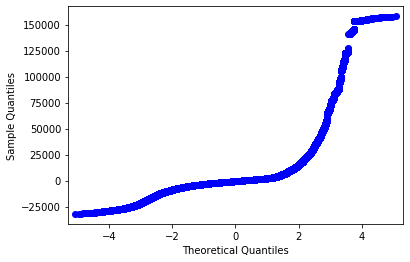

In [104]:
fig = sm.qqplot(reg_multi_v2.resid)
savefig('qqplotrreg_multi_v2.png', transparent=True)
plt.show()

In [105]:
reg_multi_log_v2 = smf.ols('np.log(income)~np.log(gdpppp)+gini+np.log(c_i_parents)', data=dataMission4).fit()
print(reg_multi_log_v2.summary())

                            OLS Regression Results                            
Dep. Variable:         np.log(income)   R-squared:                       0.699
Model:                            OLS   Adj. R-squared:                  0.699
Method:                 Least Squares   F-statistic:                 4.489e+06
Date:                Tue, 10 Nov 2020   Prob (F-statistic):               0.00
Time:                        14:11:20   Log-Likelihood:            -6.6208e+06
No. Observations:             5800000   AIC:                         1.324e+07
Df Residuals:                 5799996   BIC:                         1.324e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept              -0.3815    

In [106]:
reg_multi_log2_v2 = smf.ols('np.log(income)~np.log(gdpppp)+gini+c_i_parents', data=dataMission4).fit()
print(reg_multi_log2_v2.summary())

                            OLS Regression Results                            
Dep. Variable:         np.log(income)   R-squared:                       0.705
Model:                            OLS   Adj. R-squared:                  0.705
Method:                 Least Squares   F-statistic:                 4.622e+06
Date:                Tue, 10 Nov 2020   Prob (F-statistic):               0.00
Time:                        14:11:22   Log-Likelihood:            -6.5614e+06
No. Observations:             5800000   AIC:                         1.312e+07
Df Residuals:                 5799996   BIC:                         1.312e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          0.2399      0.003     76.

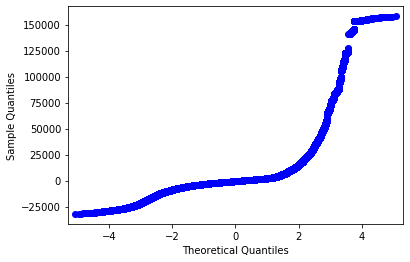

In [107]:
fig = sm.qqplot(reg_multi_v2.resid)
savefig('16_qqplotrreg_multi_v2log.png', transparent=True)
plt.show()

In [108]:
reg_multi_log2_v2.rsquared

0.7050772628836961

Pourcentage expliqué par la variance :  
-sans log : 8.7%  
-Avev log : 57% 

Décomposition total de variance expliquée:  
-Pays+parents : 57.4%  
-Autre Facteurs: 42.6% 

## verification du modèle 

### Analyse graphique 

In [130]:
fitted_vals = reg_multi_log2_v2.predict()
resids = reg_multi_log2_v2.resid
resids_standardized = reg_multi_log2_v2.get_influence().resid_studentized_internal
analyseGraphique = False

In [131]:
#Residuals vs fitted
if analyseGraphique == True :
    sns.regplot(x=fitted_vals, y=resids, lowess=True, line_kws={'color': 'red'})
    fig.show()

In [132]:
#Scale-location
if analyseGraphique == True :
    sns.regplot(x=fitted_vals, y=np.sqrt(np.abs(resids_standardized)), lowess=True, line_kws={'color': 'red'})
    fig.show()

In [133]:
#normalité
if analyseGraphique == True :
    sm.ProbPlot(reg_multi_log2_v2.resid).qqplot(line='s');
    plt.title('Q-Q plot');
    fig.show()

### Valeurs typiques ou influentes

In [134]:
alpha = 0.05
n = dataMission4.shape[0] #nb indiv
p = 4 #nb variables 

In [135]:
analyses = pd.DataFrame({'obs':np.arange(1, n+1)})

#### leviers 

In [136]:
plotLeviers = False
if plotLeviers == True :

    analyses['levier'] = reg_multi_log2_v2.get_influence().hat_matrix_diag

    seuil_levier = 2*p/n
    plt.figure(figsize=(10,6))
    plt.bar(analyses['obs'], analyses['levier'])
    plt.xticks(np.arange(0, 115, step=5))
    plt.xlabel('Observation')
    plt.ylabel('Leviers')
    plt.plot([0, 115], [seuil_levier, seuil_levier], color='r')
    plt.show()

In [137]:
if plotLeviers == True :
    #les points supérieurs au levier
    analyses.loc[analyses['levier'] > seuil_levier, :]

#### Calculs studentisés résidus 

In [138]:
plotResidusStudentise = False
if plotResidusStudentise == True:
    analyses['rstudent'] = reg_multi_log2_v2.get_influence().resid_studentized_internal
    seuil_rstudent = t.ppf(1-alpha/2,n-p-1)

    plt.figure(figsize=(10,6))
    plt.bar(analyses['obs'], analyses['rstudent'])
    plt.xticks(np.arange(0, 115, step=5))
    plt.xlabel('Observation')
    plt.ylabel('Résidus studentisés')
    plt.plot([0, 115], [seuil_rstudent, seuil_rstudent], color='r')
    plt.plot([0, 115], [-seuil_rstudent, -seuil_rstudent], color='r')
    plt.show()

### Théorème de Gauss-Markov

Estimateurs des moindres carrés meilleur estimateur BLUE (best linear unbiaised estimator):  
-moyenne de l'eperance des résiduts = 0  
-Pas de multicolinéarité parfaite (VIF >10)  
-Erreurs ont une variance égale (homoscédasticité)   

In [139]:
#moyenne des résidus
reg_multi_log2_v2.resid.mean()

-2.7921098925629858e-12

In [140]:
#Multicolinéarité
variables = reg_multi_log2_v2.model.exog
[variance_inflation_factor(variables, i) for i in np.arange(1,variables.shape[1])]

[1.0971548314484398, 1.0971548294865836, 1.0000000050118556]

In [141]:
#Homoscédasticité 
bp_test = pd.DataFrame(sms.het_breuschpagan(reg_multi_log2_v2.resid, reg_multi_log2_v2.model.exog), 
                           columns=['value'],
                           index=['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value'])
gq_test = pd.DataFrame(sms.het_goldfeldquandt(reg_multi_log2_v2.resid, reg_multi_log2_v2.model.exog)[:-1],
                           columns=['value'],
                           index=['F statistic', 'p-value'])

print('\n Breusch-Pagan test ----')
print(bp_test)
print('\n Goldfeld-Quandt test ----')
print(gq_test)


 Breusch-Pagan test ----
                                       value
Lagrange multiplier statistic  188092.256959
p-value                             0.000000
f-value                         64798.780732
f p-value                           0.000000

 Goldfeld-Quandt test ----
                value
F statistic  1.109754
p-value      0.000000


### Test de la normalité des résidus 

In [142]:
jb = stats.jarque_bera(reg_multi_log2_v2.resid)
sw = stats.shapiro(reg_multi_log2_v2.resid)
ad = stats.anderson(reg_multi_log2_v2.resid, dist='norm')
ks = stats.kstest(reg_multi_log2_v2.resid, 'norm')
    
print(f'Jarque-Bera test ---- statistic: {jb[0]:.4f}, p-value: {jb[1]}')
print(f'Shapiro-Wilk test ---- statistic: {sw[0]:.4f}, p-value: {sw[1]:.4f}')
print(f'Kolmogorov-Smirnov test ---- statistic: {ks.statistic:.4f}, p-value: {ks.pvalue:.4f}')
print(f'Anderson-Darling test ---- statistic: {ad.statistic:.4f}, 5% critical value: {ad.critical_values[2]:.4f}')
    

E:\Python\lib\site-packages\scipy\stats\morestats.py:1676: UserWarning:

p-value may not be accurate for N > 5000.



Jarque-Bera test ---- statistic: 433297.7981, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.9915, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.0838, p-value: 0.0000
Anderson-Darling test ---- statistic: 5500.2283, 5% critical value: 0.7870
